<a href="https://colab.research.google.com/github/walaaben20/pojet-big-data/blob/main/Projet_Big_data_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [85]:
# Importation des bibliothèques nécessaires
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, length



In [86]:
# Création d'une session Spark
spark = SparkSession.builder \
    .appName("Healthcare Data Processing") \
    .getOrCreate()

In [87]:
#importation de drive
from google.colab import drive
drive.mount("/content/mydrive")


Drive already mounted at /content/mydrive; to attempt to forcibly remount, call drive.mount("/content/mydrive", force_remount=True).


In [88]:
data_path = "/content/mydrive/MyDrive/healthcare/healthcare_-_train.csv.csv"
data = spark.read.csv(data_path, header=True, inferSchema=True)

In [89]:
# Aperçu des données
data.show(5)
data.printSchema()

+----+--------------------+--------------------+
| _c0|              prompt|            response|
+----+--------------------+--------------------+
|NULL|Who is at risk fo...|LCMV infections c...|
|NULL|What are the symp...|LCMV is most comm...|
|NULL|Who is at risk fo...|Individuals of al...|
|NULL|How to diagnose L...|During the first ...|
|NULL|What are the trea...|Aseptic meningiti...|
+----+--------------------+--------------------+
only showing top 5 rows

root
 |-- _c0: string (nullable = true)
 |-- prompt: string (nullable = true)
 |-- response: string (nullable = true)



In [90]:
# Simplification du fichier : sélection des colonnes nécessaires (par exemple, 'prompt' et 'response')
simplified_data = data.select("prompt", "response")

In [91]:
simplified_data.show(5)

+--------------------+--------------------+
|              prompt|            response|
+--------------------+--------------------+
|Who is at risk fo...|LCMV infections c...|
|What are the symp...|LCMV is most comm...|
|Who is at risk fo...|Individuals of al...|
|How to diagnose L...|During the first ...|
|What are the trea...|Aseptic meningiti...|
+--------------------+--------------------+
only showing top 5 rows



In [92]:
# Suppression des doublons
simplified_data = simplified_data.dropDuplicates()

In [93]:
# Filtrage des lignes avec des longueurs de texte inférieures à 10 caractères
simplified_data = simplified_data.filter((length(col("prompt")) >= 10) & (length(col("response")) >= 10))

In [94]:
# Sauvegarde du fichier simplifié dans un nouveau fichier CSV
output_path = "/content/mydrive/MyDrive/healthcare/final_data.csv"
simplified_data.write.csv(output_path, header=True, mode="overwrite")
print("Final simplified data saved at", output_path)

Final simplified data saved at /content/mydrive/MyDrive/healthcare/final_data.csv


##Nettoyage et prétraitement des données


In [95]:
# Sélection des colonnes nécessaires
new_data = data.select("prompt", "response")

In [96]:
# Affichage des doublons globaux et sur une colonne spécifique
print("Doublons globaux :", new_data.dropDuplicates().count() - new_data.count())
print("Doublons dans 'prompt' :", new_data.dropDuplicates(["prompt"]).count() - new_data.count())

Doublons globaux : -12081
Doublons dans 'prompt' : -14173


In [97]:
# Suppression des doublons globaux
df = new_data.dropDuplicates()

In [98]:
# Suppression des doublons basés uniquement sur la colonne 'prompt'
df = df.dropDuplicates(["prompt"])

In [99]:
# Compter les valeurs manquantes
df.select([col(c).isNull().cast("int").alias(c + "_missing") for c in df.columns]).show()

+--------------+----------------+
|prompt_missing|response_missing|
+--------------+----------------+
|             1|               1|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               1|
|             0|               0|
|             0|               1|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               1|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               0|
|             0|               1|
+--------------+----------------+
only showing top 20 rows



In [100]:
# Suppression des lignes avec des longueurs de 'prompt' ou 'response' < 10
df = df.filter((length(col("prompt")) >= 10) & (length(col("response")) >= 10))

In [101]:
# Réinitialisation de l'index (non nécessaire avec PySpark, mais les données sont maintenant propres)
df.show()

+--------------------+--------------------+
|              prompt|            response|
+--------------------+--------------------+
| ""A 'rest time' ...| after it has bee...|
| 1 out of 90 Ashk...|     and 1 out of 30|
| 119 people with ...|700 treated with ...|
| 30 days) followi...| the first stage ...|
| 5% has been appr...| does not kill li...|
| Ancylostoma duod...| are worldwide in...|
| Ashkenazi Jews a...| are more likely ...|
|           Bilateral| and Cavitary Ret...|
| CDC estimates th...|000 persons with ...|
| CDC has develope...| hospital-based g...|
|    CK or CKMB tests| and serum myoglo...|
|  Causes of Diabetes| or by calling 18...|
|     Central America| and South Americ...|
|          Charleston|      South Carolina|
| DEC can cause se...| including enceph...|
| Dravet syndrome ...| febrile seizures...|
| For People of Af...|       Mediterranean|
|       HIV infection| a transplant or ...|
| High Blood Pressure|        and Diabetes|
| I will eat _____...| I will ea

##Ajout de nouvelles colonnes

In [102]:
# Importation de 'expr' depuis 'pyspark.sql.functions'
from pyspark.sql.functions import expr

# Ajout d'une colonne pour le nombre de mots dans chaque 'prompt'
df = df.withColumn("prompt_word_count", expr("size(split(prompt, ' '))"))

# Affichage du DataFrame après l'ajout de la colonne
df.show()


+--------------------+--------------------+-----------------+
|              prompt|            response|prompt_word_count|
+--------------------+--------------------+-----------------+
| ""A 'rest time' ...| after it has bee...|               16|
| 1 out of 90 Ashk...|     and 1 out of 30|               11|
| 119 people with ...|700 treated with ...|                9|
| 30 days) followi...| the first stage ...|                8|
| 5% has been appr...| does not kill li...|               32|
| Ancylostoma duod...| are worldwide in...|                6|
| Ashkenazi Jews a...| are more likely ...|                5|
|           Bilateral| and Cavitary Ret...|                2|
| CDC estimates th...|000 persons with ...|                7|
| CDC has develope...| hospital-based g...|                5|
|    CK or CKMB tests| and serum myoglo...|                5|
|  Causes of Diabetes| or by calling 18...|                4|
|     Central America| and South Americ...|                3|
|       

In [103]:
# Ajout d'une colonne pour le nombre de mots dans chaque 'response'
df = df.withColumn("response_word_count", expr("size(split(response, ' '))"))

In [104]:
df.show()

+--------------------+--------------------+-----------------+-------------------+
|              prompt|            response|prompt_word_count|response_word_count|
+--------------------+--------------------+-----------------+-------------------+
| ""A 'rest time' ...| after it has bee...|               16|                  9|
| 1 out of 90 Ashk...|     and 1 out of 30|               11|                  6|
| 119 people with ...|700 treated with ...|                9|                 25|
| 30 days) followi...| the first stage ...|                8|                 15|
| 5% has been appr...| does not kill li...|               32|                 69|
| Ancylostoma duod...| are worldwide in...|                6|                  7|
| Ashkenazi Jews a...| are more likely ...|                5|                 14|
|           Bilateral| and Cavitary Ret...|                2|                  4|
| CDC estimates th...|000 persons with ...|                7|                 35|
| CDC has develo

## Visualisation des données avec matplotlib

In [105]:
import matplotlib.pyplot as plt

In [106]:
# Conversion en Pandas pour visualisation
df_pd = df.toPandas()

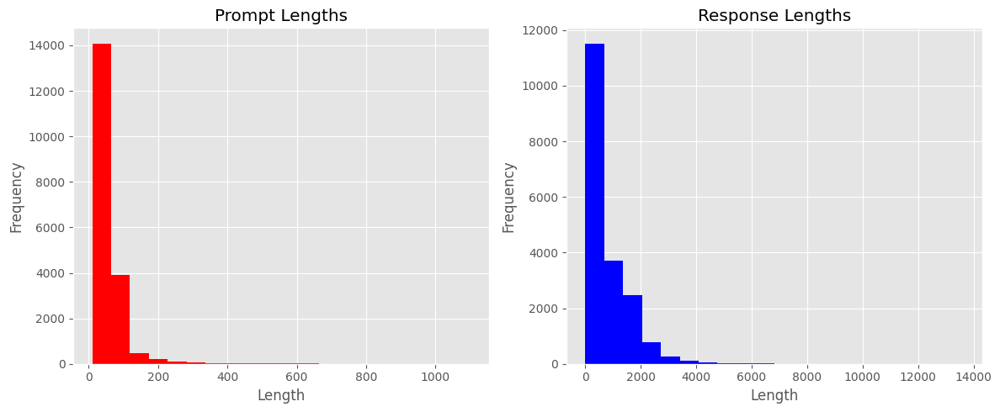

In [107]:
import matplotlib.pyplot as plt

# Conversion des colonnes 'prompt' et 'response' en Pandas pour effectuer des opérations sur les chaînes
prompt_lengths = df.select(length(col("prompt")).alias("prompt_length")).toPandas()["prompt_length"]
response_lengths = df.select(length(col("response")).alias("response_length")).toPandas()["response_length"]

# Création de la figure avec deux sous-graphiques
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Premier histogramme : distribution des longueurs des 'prompts'
ax1.hist(prompt_lengths, color='red', bins=20)
ax1.set_title('Prompt Lengths')  # Titre du premier histogramme
ax1.set_xlabel('Length')         # Étiquette de l'axe x
ax1.set_ylabel('Frequency')      # Étiquette de l'axe y

# Deuxième histogramme : distribution des longueurs des 'responses'
ax2.hist(response_lengths, color='blue', bins=20)
ax2.set_title('Response Lengths') # Titre du second histogramme
ax2.set_xlabel('Length')          # Étiquette de l'axe x
ax2.set_ylabel('Frequency')       # Étiquette de l'axe y

# Affichage de la figure avec les deux sous-graphiques
plt.tight_layout()  # Ajuste les espacements entre les graphiques
plt.show()


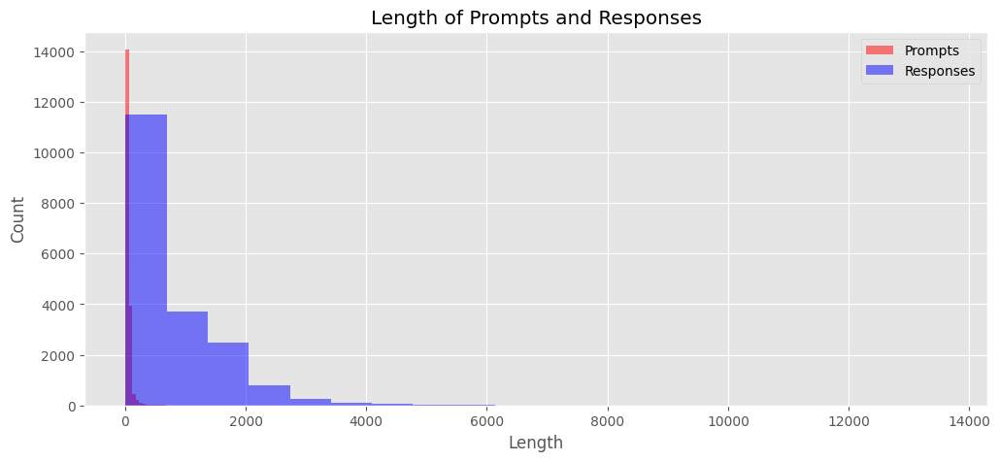

In [108]:
# Distribution des longueurs des 'prompt' et 'response'
plt.figure(figsize=(12, 5))
plt.hist(df_pd["prompt"].apply(len), bins=20, alpha=0.5, color="red", label="Prompts")
plt.hist(df_pd["response"].apply(len), bins=20, alpha=0.5, color="blue", label="Responses")
plt.legend()
plt.xlabel("Length")
plt.ylabel("Count")
plt.title("Length of Prompts and Responses")
plt.show()

Text(0.5, 1.0, 'Word Count Distribution')

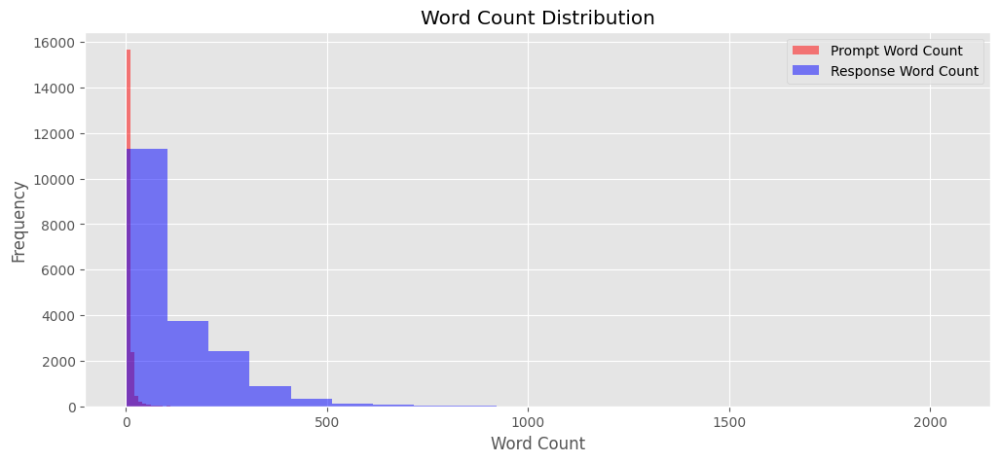

In [109]:
# Distribution des comptes de mots
plt.figure(figsize=(12, 5))
plt.hist(df_pd["prompt_word_count"], bins=20, alpha=0.5, color="red", label="Prompt Word Count")
plt.hist(df_pd["response_word_count"], bins=20, alpha=0.5, color="blue", label="Response Word Count")
plt.legend()
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.title("Word Count Distribution")

##Sauvegarde des données finales

In [110]:
# Sauvegarde du DataFrame final dans un fichier CSV
output_path = "/content/mydrive/MyDrive/healthcare/final_data1.csv"
df.write.csv(output_path, header=True, mode="overwrite")

print("Final data saved at", output_path)

Final data saved at /content/mydrive/MyDrive/healthcare/final_data1.csv


In [111]:
!pip install pyspark

In [112]:
#initialisez une session Spark pour pouvoir manipuler les données avec PySpark :
from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local[*]").getOrCreate()

##Chargement et Prétraitement des Données avec PySpark

In [113]:
import os
print(os.getcwd())  # Affiche le répertoire courant

/content/mydrive/MyDrive/healthcare


In [114]:
import os
os.chdir('/content/mydrive/MyDrive/healthcare')  # Changez le répertoire de travail
print(os.getcwd())  # Vérifiez que vous êtes dans le bon répertoire

/content/mydrive/MyDrive/healthcare


In [115]:
import os
print(os.path.exists('final_data.csv'))  # Vérifie si le fichier existe

True


In [116]:
data_path = '/content/mydrive/MyDrive/healthcare/final_data.csv'
df_spark = spark.read.csv(data_path, header=True, inferSchema=True)


In [117]:
# Affichage des 10 premières lignes
df_spark.show(10)

+--------------------+--------------------+
|              prompt|            response|
+--------------------+--------------------+
|only four countri...|the Dominican Rep...|
|What are the symp...|After an incubati...|
|in part because t...|a blood cell that...|
|What is (are) Par...|Trichinellosis, a...|
|What are the trea...|There is no cure ...|
|one from each par...|each of their chi...|
|What to do for Wh...|Your health care ...|
|What is (are) Ane...|Anemia is a condi...|
|for patients on h...|many studies show...|
|What to do for Wh...|- Bladder problem...|
+--------------------+--------------------+
only showing top 10 rows



In [118]:
# Suppression des colonnes "prompt_word_count" et "response_word_count"
df_spark = df_spark.drop("prompt_word_count", "response_word_count")

In [119]:
# Affichage des 10 premières lignes après suppression
df_spark.show(10)

+--------------------+--------------------+
|              prompt|            response|
+--------------------+--------------------+
|only four countri...|the Dominican Rep...|
|What are the symp...|After an incubati...|
|in part because t...|a blood cell that...|
|What is (are) Par...|Trichinellosis, a...|
|What are the trea...|There is no cure ...|
|one from each par...|each of their chi...|
|What to do for Wh...|Your health care ...|
|What is (are) Ane...|Anemia is a condi...|
|for patients on h...|many studies show...|
|What to do for Wh...|- Bladder problem...|
+--------------------+--------------------+
only showing top 10 rows



In [120]:
# Échantillonnage aléatoire de 9000 lignes
df_sampled = df_spark.sample(False, 9000 / df_spark.count(), seed=42)

In [121]:
print("Nombre de lignes dans df_sampled :", df_sampled.count())


Nombre de lignes dans df_sampled : 9048


In [122]:
# Séparation en jeu d'entraînement et jeu de test (90/10)
train_df = df_sampled.sample(False, 0.9, seed=42)

test_df = df_sampled.exceptAll(train_df)

In [123]:
# Sauvegarde des datasets sous format JSONL pour être utilisés dans l'entraînement
train_df.write.json('train.jsonl', mode='overwrite')
test_df.write.json('test.jsonl', mode='overwrite')

In [124]:
print("Nombre de lignes dans train_df :", train_df.count())


Nombre de lignes dans train_df : 8163


##Traitement des Datasets avec PySpark

In [125]:
# Transformation des données en format texte pour l'entraînement
def process_data(row):
    system_message = "Hello! I'm here to provide concise information about general health problem, including their causes, symptoms, treatments, and recommended medications. How can I assist you today?"
    prompt = row['prompt']
    response = row['response']
    return {'text': f'[INST] <<SYS>>\n{system_message.strip()}\n<</SYS>>\n\n{prompt} [/INST] {response}'}

In [126]:
train_rdd = train_df.rdd
test_rdd = test_df.rdd

In [127]:
print("Nombre de lignes dans train_rdd :", train_rdd.count())
print("Nombre de lignes dans test_rdd :", test_rdd.count())


Nombre de lignes dans train_rdd : 8163
Nombre de lignes dans test_rdd : 885


In [128]:
# Conversion en DataFrame pour utilisation dans le fine-tuning
train_spark_df = spark.createDataFrame(train_rdd)
test_spark_df = spark.createDataFrame(test_rdd)

In [129]:
# Sauvegarde des datasets prétraités
train_spark_df.write.json('train_processed.jsonl', mode='overwrite')
test_spark_df.write.json('test_processed.jsonl', mode='overwrite')

##Chargement et Fine-Tuning du Modèle

In [130]:
!pip install datasets

In [131]:
#importation de load datasets
from datasets import load_dataset

In [132]:
#verification de la presence exacte de fichier
import os

file_path = '/content/train_processed.jsonl'
if os.path.exists(file_path):
    print(f"File found: {file_path}")
else:
    print(f"File not found: {file_path}")

File found: /content/train_processed.jsonl


In [133]:
#affichage de fichiers existant dans content
import os
print(os.listdir('/content/'))

['.config', 'test.jsonl', 'train.jsonl', 'mydrive', 'train_processed.jsonl', 'test_processed.jsonl', 'sample_data']


In [134]:
import os

file_path = '/content/train_processed.jsonl'

if os.path.isfile(file_path):
    print(f"{file_path} is a valid file.")
elif os.path.isdir(file_path):
    print(f"{file_path} is a directory!")
else:
    print(f"{file_path} does not exist or is not a file.")


/content/train_processed.jsonl is a directory!


In [135]:
import shutil

directory_path = '/content/train_processed.jsonl'

if os.path.isdir(directory_path):
    print(f"Supprimons le répertoire : {directory_path}")
    shutil.rmtree(directory_path)  # Supprime le répertoire et son contenu
else:
    print(f"{directory_path} n'est pas un répertoire.")

Supprimons le répertoire : /content/train_processed.jsonl


In [136]:
# Exemple de création d'un fichier JSONL minimal
import json
import pandas as pd

# Chemin vers le fichier CSV contenant les données
csv_file_path = '/content/mydrive/MyDrive/healthcare/final_data (1).csv'

# Lecture du fichier CSV
try:
    # Charger les données CSV dans un DataFrame
    df = pd.read_csv(csv_file_path)

    # Convertir les données du DataFrame en une liste de dictionnaires
    # Supposons que le fichier CSV a deux colonnes : 'prompt' et 'response'
    data = df.to_dict(orient='records')

    # Chemin de sortie du fichier JSONL
    jsonl_file_path = '/content/train_processed.jsonl'

    # Écriture dans le fichier JSONL
    with open(jsonl_file_path, 'w') as f:
        for record in data:
            f.write(json.dumps(record) + '\n')

    print(f"Fichier JSONL créé avec succès : {jsonl_file_path}")

except FileNotFoundError:
    print(f"Erreur : Le fichier '{csv_file_path}' est introuvable.")
except Exception as e:
    print(f"Une erreur s'est produite : {e}")


Fichier JSONL créé avec succès : /content/train_processed.jsonl


In [137]:
#recharge de donnees
from datasets import load_dataset

train_dataset = load_dataset('json', data_files='/content/train_processed.jsonl', split="train")
print(train_dataset)


Generating train split: 0 examples [00:00, ? examples/s]

Dataset({
    features: ['prompt', 'response', 'prompt_word_count', 'response_word_count'],
    num_rows: 14978
})


In [138]:
train_dataset = load_dataset('json', data_files='/content/train_processed.jsonl', split="train")
valid_dataset = load_dataset('json', data_files='/content/train_processed.jsonl', split="train")

In [139]:
!pip install gradio

In [140]:
!pip install transformers accelerate

In [141]:
!pip install transformers torch gradio

In [142]:
pip install transformers datasets torch


In [143]:
from pyspark.sql import SparkSession
from pyspark import SparkContext, SparkConf
from google.colab import drive

In [144]:
from pyspark.sql import SparkSession

# Créez la session Spark et chargez le fichier
spark = SparkSession.builder.master("local[*]").appName("Healthcare Chatbot").getOrCreate()
data_path = "/content/mydrive/MyDrive/healthcare/final_data.csv"
df = spark.read.csv(data_path, header=True, inferSchema=True)

# Convertir le DataFrame en Pandas pour plus de flexibilité
df_pd = df.toPandas()

# Vérifier les 5 premières lignes du fichier
print(df_pd.head())


                                              prompt  \
0  only four countries are currently known to be ...   
1  What are the symptoms of Hendra Virus Disease ...   
2  in part because there are no readily available...   
3  What is (are) Parasites - Trichinellosis (also...   
4  What are the treatments for Inclusion Body Myo...   

                                            response  
0                             the Dominican Republic  
1  After an incubation of 9-16 days, infection wi...  
2  a blood cell that can be elevated in the prese...  
3  Trichinellosis, also called trichinosis, is ca...  
4  There is no cure for IBM, nor is there a stand...  


In [145]:
from transformers import AutoTokenizer

# Charger le tokenizer pour BioBERT
tokenizer = AutoTokenizer.from_pretrained("dmis-lab/biobert-base-cased-v1.1")

# Définir le pad_token
tokenizer.add_special_tokens({'pad_token': '[PAD]'})



def tokenize_function(examples):
    # Concaténer 'prompt' et 'response' pour chaque entrée (vous pouvez adapter cette partie en fonction de vos besoins spécifiques)
    # Si vous utilisez BioBERT pour des tâches comme la classification, vous n'avez pas besoin de "prompt" et "response", mais simplement du texte d'entrée.
    texts = [f"[CLS] {prompt} [SEP] {response} [SEP]" for prompt, response in zip(examples['prompt'], examples['response'])]

    # Utilisation du tokenizer pour transformer le texte
    return tokenizer(texts, truncation=True, max_length=512, padding="max_length")

# Appliquer la fonction de tokenisation sur le dataset entier
tokenized_train = train_dataset.map(tokenize_function, batched=True)

# Vérification après la tokenisation
print(tokenized_train[0])



Map:   0%|          | 0/14978 [00:00<?, ? examples/s]

{'prompt': 'Who is at risk for Lymphocytic Choriomeningitis (LCM)? ?', 'response': 'LCMV infections can occur after exposure to fresh urine, droppings, saliva, or nesting materials from infected rodents. Transmission may also occur when these materials are directly introduced into broken skin, the nose, the eyes, or the mouth, or presumably, via the bite of an infected rodent. Person-to-person transmission has not been reported, with the exception of vertical transmission from infected mother to fetus, and rarely, through organ transplantation.', 'prompt_word_count': 9, 'response_word_count': 68, 'input_ids': [101, 101, 1150, 1110, 1120, 3187, 1111, 181, 25698, 13335, 23894, 22572, 20571, 2354, 1158, 10721, 113, 181, 1665, 1306, 114, 136, 136, 102, 181, 1665, 1306, 1964, 16565, 1169, 4467, 1170, 7401, 1106, 4489, 19968, 117, 7367, 1116, 117, 21718, 24186, 117, 1137, 24056, 3881, 1121, 10594, 8335, 5240, 119, 6580, 1336, 1145, 4467, 1165, 1292, 3881, 1132, 2626, 2234, 1154, 3088, 2241, 

In [146]:
from transformers import AutoModelForSequenceClassification, Trainer, TrainingArguments, AutoTokenizer
from datasets import load_dataset
import os

# Désactiver W&B si non utilisé
os.environ["WANDB_DISABLED"] = "true"

# Charger le modèle pré-entraîné BioBERT
model = AutoModelForSequenceClassification.from_pretrained("dmis-lab/biobert-base-cased-v1.1", num_labels=2)

# Charger le tokenizer
tokenizer = AutoTokenizer.from_pretrained("dmis-lab/biobert-base-cased-v1.1")

# Charger les données depuis un fichier JSONL
dataset = load_dataset('json', data_files='/content/train_processed.jsonl')

# Diviser les données en ensembles d'entraînement et d'évaluation
train_dataset = dataset['train'].train_test_split(test_size=0.2, seed=42)['train']
eval_dataset = dataset['train'].train_test_split(test_size=0.2, seed=42)['test']

# **1. Ajuster la structure des données**
def adjust_dataset_format(dataset):
    # Vérifiez chaque entrée pour qu'elle ait les bonnes colonnes
    print("Avant ajustement :", dataset[0])  # Debugging
    return dataset.map(lambda x: {"prompt": x["prompt"], "response": x["response"]})

train_dataset = adjust_dataset_format(train_dataset)
eval_dataset = adjust_dataset_format(eval_dataset)

# **2. Vérifiez les colonnes et une entrée**
print("Colonnes train_dataset :", train_dataset.column_names)
print("Première entrée train_dataset :", train_dataset[0])

# **3. Prétraitement et tokenisation**
def preprocess_function(examples):
    print("Exemple avant tokenisation :", examples)  # Debugging
    return tokenizer(
        examples["prompt"],  # Assurez-vous que "prompt" existe
        truncation=True,
        padding="max_length",
        max_length=512
    )

# Appliquer la tokenisation
train_dataset = train_dataset.map(preprocess_function, batched=True)
eval_dataset = eval_dataset.map(preprocess_function, batched=True)

# Arguments d'entraînement
training_args = TrainingArguments(
    output_dir="./results",
    num_train_epochs=3,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    logging_dir="./logs",
    logging_steps=10,
    save_steps=100,
    eval_strategy="steps",
    eval_steps=100,
    warmup_steps=500,
    weight_decay=0.01,
    save_total_limit=2,
    load_best_model_at_end=True,
)

# Initialiser le Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
)




Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dmis-lab/biobert-base-cased-v1.1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Avant ajustement : {'prompt': 'What is (are) Mitochondrial encephalomyopathy lactic acidosis and stroke-like episodes ?', 'response': "Mitochondrial encephalomyopathy, lactic acidosis, and stroke-like episodes (MELAS) affects many parts of the body, particularly the brain and nervous system (encephalo-) and muscles (myopathy). Symptoms typically begin in childhood and may include muscle weakness and pain, recurrent headaches, loss of appetite, vomiting, and seizures. Most affected individuals experience stroke-like episodes beginning before age 40. People with MELAS can also have a buildup of lactic acid in their bodies that can lead to vomiting, abdominal pain, fatigue, muscle weakness, and difficulty breathing. The genes associated with MELAS are located in mitochondrial DNA and therefore follow a maternal inheritance pattern (also called mitochondrial inheritance). MELAS can be inherited from the mother only, because only females pass mitochondrial DNA to their children. In some cas

Map:   0%|          | 0/11982 [00:00<?, ? examples/s]

Avant ajustement : {'prompt': 'What are the stages of Pancreatic Cancer ?', 'response': 'Key Points\n- Tests and procedures to stage pancreatic cancer are usually done at the same time as diagnosis. - There are three ways that cancer spreads in the body. - Cancer may spread from where it began to other parts of the body. - The following stages are used for pancreatic cancer: - Stage 0 (Carcinoma in Situ) - Stage I - Stage II - Stage III - Stage IV\nTests and procedures to stage pancreatic cancer are usually done at the same time as diagnosis.\nThe process used to find out if cancer has spread within the pancreas or to other parts of the body is called staging. The information gathered from the staging process determines the stage of the disease. It is important to know the stage of the disease in order to plan treatment. The results of some of the tests used to diagnose pancreatic cancer are often also used to stage the disease. See the General Information section for more information.

Map:   0%|          | 0/2996 [00:00<?, ? examples/s]

Colonnes train_dataset : ['prompt', 'response', 'prompt_word_count', 'response_word_count']
Première entrée train_dataset : {'prompt': 'What is (are) Mitochondrial encephalomyopathy lactic acidosis and stroke-like episodes ?', 'response': "Mitochondrial encephalomyopathy, lactic acidosis, and stroke-like episodes (MELAS) affects many parts of the body, particularly the brain and nervous system (encephalo-) and muscles (myopathy). Symptoms typically begin in childhood and may include muscle weakness and pain, recurrent headaches, loss of appetite, vomiting, and seizures. Most affected individuals experience stroke-like episodes beginning before age 40. People with MELAS can also have a buildup of lactic acid in their bodies that can lead to vomiting, abdominal pain, fatigue, muscle weakness, and difficulty breathing. The genes associated with MELAS are located in mitochondrial DNA and therefore follow a maternal inheritance pattern (also called mitochondrial inheritance). MELAS can be i

Map:   0%|          | 0/11982 [00:00<?, ? examples/s]

Exemple avant tokenisation : {'prompt': ['What is (are) Mitochondrial encephalomyopathy lactic acidosis and stroke-like episodes ?', 'What are the symptoms of Eosinophilic fasciitis ?', 'What is (are) Hypomyelination with atrophy of basal ganglia and cerebellum ?', 'What are the symptoms of Progressive external ophthalmoplegia, autosomal recessive 1 ?', 'Is Gaucher disease inherited ?', 'What are the symptoms of Cohen syndrome ?', 'What is (are) 15q11.2 microdeletion ?', 'What are the genetic changes related to alpha thalassemia X-linked intellectual disability syndrome ?', 'What are the symptoms of Congenital generalized lipodystrophy type 1 ?', 'How many people are affected by epidermal nevus ?', 'What are the treatments for Bronchiolitis obliterans organizing pneumonia ?', 'What are the treatments for Leber hereditary optic neuropathy ?', 'How many people are affected by MECP2-related severe neonatal encephalopathy ?', 'What is (are) TARP syndrome ?', 'What are the symptoms of Achon

Map:   0%|          | 0/2996 [00:00<?, ? examples/s]

Exemple avant tokenisation : {'prompt': ['What are the stages of Pancreatic Cancer ?', 'What are the treatments for Alpers-Huttenlocher syndrome ?', 'What are the symptoms of Antley Bixler syndrome ?', 'What is (are) Hemophilia ?', 'What are the symptoms of Emery-Dreifuss muscular dystrophy, X-linked ?', 'How many people are affected by gyrate atrophy of the choroid and retina ?', 'What are the symptoms of Bietti crystalline corneoretinal dystrophy ?', 'What are the symptoms of Kidney Stones in Children ?', 'What are the genetic changes related to Coffin-Siris syndrome ?', 'How to diagnose Acquired Cystic Kidney Disease ?', 'What is (are) Rashes ?', 'What is (are) Gilbert syndrome ?', 'What are the symptoms of Chronic inflammatory demyelinating polyneuropathy ?', 'What is the outlook for Traumatic Brain Injury ?', 'What is (are) Parasites - Lymphatic Filariasis ?', 'What are the treatments for mannose-binding lectin deficiency ?', 'What are the symptoms of Carpotarsal osteochondromatos

Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


In [147]:
# Assurez-vous que Spark est configuré et les données sont chargées
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

# Initialiser la session Spark
spark = SparkSession.builder.appName("Healthcare Chatbot").getOrCreate()

# Charger les données de final_data.csv
data_path = "/content/mydrive/MyDrive/healthcare/final_data (1).csv"
df = spark.read.csv(data_path, header=True, inferSchema=True)
# Convertir en DataFrame Pandas pour une recherche plus facile
df_pd = df.toPandas()

In [148]:
from datasets import Dataset
import pandas as pd

# Charger votre dataset
df = pd.read_csv("/content/mydrive/MyDrive/healthcare/final_data (1).csv")  # Assurez-vous que prompt et response existent dans le CSV

# Créez un dataset Hugging Face
hf_dataset = Dataset.from_pandas(df)

# Divisez le dataset en entraînement et validation
train_test_split = hf_dataset.train_test_split(test_size=0.2)
train_dataset = train_test_split["train"]
eval_dataset = train_test_split["test"]


In [149]:
from transformers import AutoTokenizer

# Charger le tokenizer
tokenizer = AutoTokenizer.from_pretrained("dmis-lab/biobert-base-cased-v1.1")

# Tokenizer les prompts et responses
def preprocess_function(examples):
    return tokenizer(examples["prompt"], examples["response"], truncation=True, padding=True, max_length=128)

# Appliquer la tokenisation
train_dataset = train_dataset.map(preprocess_function, batched=True)
eval_dataset = eval_dataset.map(preprocess_function, batched=True)


Map:   0%|          | 0/11982 [00:00<?, ? examples/s]

Map:   0%|          | 0/2996 [00:00<?, ? examples/s]

In [150]:
from transformers import AutoModelForSequenceClassification

# Charger le modèle pour la classification (2 classes)
model = AutoModelForSequenceClassification.from_pretrained(
    "dmis-lab/biobert-base-cased-v1.1",
    num_labels=2  # Ajustez selon votre tâche
)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dmis-lab/biobert-base-cased-v1.1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [151]:
# Vérifier l'état de votre GPU (optionnel)
!nvidia-smi

Thu Dec  5 16:19:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0              29W /  70W |   2421MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [152]:
# Importer les bibliothèques nécessaires
import gradio as gr
import random
import time
import numpy as np
from transformers import AutoTokenizer
import transformers
import torch

In [159]:
print(train_dataset[0])  # Afficher le premier exemple
print(train_dataset[1])  # Afficher le deuxième exemple


{'input_ids': tensor([  101,  1142,  1110,   170,  6876,  5250, 18378,   122,   102]), 'token_type_ids': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1]), 'labels': tensor(0)}
{'input_ids': tensor([  101,  1330,  6876,  5250, 18378,   102,     0,     0,     0]), 'token_type_ids': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 0, 0, 0]), 'labels': tensor(1)}


In [162]:
# Sauvegarder le modèle
model.save_pretrained("./biobert-finetuned")
tokenizer.save_pretrained("./biobert-finetuned")


('./biobert-finetuned/tokenizer_config.json',
 './biobert-finetuned/special_tokens_map.json',
 './biobert-finetuned/vocab.txt',
 './biobert-finetuned/added_tokens.json',
 './biobert-finetuned/tokenizer.json')

In [163]:
# Charger le modèle sauvegardé pour être sûr qu'il fonctionne correctement
from transformers import AutoModelForSequenceClassification, AutoTokenizer

model = AutoModelForSequenceClassification.from_pretrained("./biobert-finetuned")
tokenizer = AutoTokenizer.from_pretrained("./biobert-finetuned")

In [164]:
def chat_response(message):
    system_message = (
        "Welcome! You're now communicating with an AI model trained to assist with information about general health diseases. "
        "Feel free to ask about causes, symptoms, medications, and treatment options!"
    )
    prompt = f"{system_message}\n\n{message}"  # Définir le prompt ici à partir du message de l'utilisateur

    # Générer une réponse avec troncation activée et ajustements pour éviter la répétition
    sequences = pipe(
        prompt,
        do_sample=True,
        top_k=50,
        num_return_sequences=1,
        max_length=200,
        temperature=0.5,
        no_repeat_ngram_size=2,
        truncation=True  # Ajout explicite de la troncation
    )

    # Récupérer la réponse générée et supprimer les balises indésirables
    bot_message = sequences[0]['generated_text']

    # Nettoyer la sortie en enlevant les balises
    bot_message = bot_message.replace('[INST] ', '').replace(' [/INST]', '').replace('<SYS>', '').replace('</SYS>', '')

    # Supprimer tout texte indésirable (exemple : questions répétitives ou réponses incohérentes)
    bot_message = bot_message.split("The following")[0]  # On coupe la réponse au premier passage de "The following"

    return bot_message.strip()  # Supprimer les espaces superflus

In [165]:
def respond(message, chat_history):
    bot_message = chat_response(message)  # Utiliser le message de l'utilisateur pour générer une réponse

    # Ajouter les messages sous forme de dictionnaires avec 'role' et 'content'
    chat_history.append({"role": "user", "content": message})
    chat_history.append({"role": "assistant", "content": bot_message})

    return "", chat_history


In [166]:
# Interface Gradio pour le chatbot
import gradio as gr

with gr.Blocks() as demo:
    chatbot = gr.Chatbot(label="Personal Health Assistant", type='messages')  # Spécifier 'messages' pour le type
    msg = gr.Textbox()
    clear = gr.ClearButton([msg, chatbot])

    def respond(message, chat_history):
        bot_message = chat_response(message)

        # Ajouter les messages sous forme de dictionnaires avec 'role' et 'content'
        chat_history.append({"role": "user", "content": message})
        chat_history.append({"role": "assistant", "content": bot_message})

        return "", chat_history

    msg.submit(respond, [msg, chatbot], [msg, chatbot])

# Lancer l'application
demo.launch(share=True, debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://9fcdd99f04f35bbc06.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://9fcdd99f04f35bbc06.gradio.live
